<a href="https://colab.research.google.com/github/IsmaelOr/BEDU_MachineLearning_Equipo9/blob/main/proyecto_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto de Machine Learning

## Introducción
Enfermedades cardiovasculares
Las enfermedades cardiovasculares constituyen la primera causa de muerte en el mundo y se prevé que lo sigan siendo, debido al envejecimiento de la población y la prevalencia de dichas enfermedades en países de bajos recursos. Las enfermedades cardiovasculares son enfermedades del sistema circulatorio, de etiología y localización diversas. Se clasifican en cuatro tipos generales:

* Enfermedades isquémicas del corazón
* Enfermedades cerebrovasculares
* Enfermedades vasculares periféricas
* Otras enfermedades.

Las dos primeras, las de importancia mayor en magnitud, son responsables de más del 60% de la mortalidad cardiovascular total. Suelen manifestarse como fenómenos agudos. Se deben, sobre todo, a la obstrucción de los vasos, que impide que la sangre fluya hacia el corazón o el cerebro y termina produciendo la muerte.

Las enfermedades vasculares periféricas afectan a las arterias o a las venas que irrigan las piernas y los brazos. Provocan dificultades para la circulación de la sangre y comportan estrechamiento de los vasos, hinchazón y dolor. Pueden causar isquemia. Cuando afectan a las venas se forman coágulos (trombos) que dan lugar a trombosis venosa. Entre las "otras enfermedades cardiovasculares" destacan las cardiopatías congénitas y la cardiopatía reumática.

Las enfermedades cardiovasculares constituyen la primera causa de mortalidad afectando tanto a países desarrollados como a los de bajo desarrollo. En el trastorno cardiovascular interactúan tanto la susceptibilidad genética del individuo como los factores ambientales (tabaquismo,sedentarismo y dieta).

El riesgo cardiovascular se define como la probabilidad de padecer un evento cardiovascular en un determinado período. La predicción del riesgo cardiovascular ha constituido, en los últimos años, la piedra angular en las guías clínicas de prevención cardiovascular, y deviene una herramienta útil del Médico de Familia para establecer prioridades en la atención primaria, mejorando la atención a los pacientes y eligiendo más eficazmente la terapéutica a seguir, con el objetivo de acercarnos más a la realidad multifactorial de las enfermedades cardiovasculares y a su prevención.

## Postwork 1 - Introducción a Machine Learning

Para nuestro proyecto nos basamos en este Dataset: link

¿Qué contiene nuestro Dataset?
* Alrededor de 60,000 datos que corresponden al estudio de enfermedades cardiovasculares.
* 6 variables numéricas (edad, estatura, peso, imc, presión sistólica y presión diastólica).
* 7 variables categóricas (género, colesterol, glucosa, tabaco, alcohol, actividad física y enfermedad cardiovascular).

## Postwork 2

In [ ]:
# !pip install chart_studio

In [ ]:
# !pip install dataprep

In [ ]:
# !pip install jcopml

In [ ]:
import pandas as pd

from scipy import stats
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.stats import skew, kurtosis

import pprint as pp

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

from sklearn.model_selection import cross_validate

import plotly.express as px

from sklearn.linear_model import LogisticRegression

from sklearn import metrics

from sklearn.metrics import roc_curve, auc

from sklearn.cluster import KMeans

from sklearn.decomposition import PCA

from sklearn.metrics import silhouette_score
import sklearn.cluster as cluster

from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import PolynomialFeatures

from sklearn import tree as treeClassifier

from sklearn.ensemble import RandomForestClassifier as forest

from sklearn.linear_model import SGDClassifier

from numpy import loadtxt
from keras.models import Sequential
from keras.layers import Dense

from sklearn.metrics import confusion_matrix

import chart_studio.plotly as py
import plotly.express as px

from sklearn.tree import DecisionTreeRegressor

from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder

from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_absolute_error

from dataprep.eda import create_report

from sklearn.preprocessing import StandardScaler,Normalizer,MinMaxScaler,RobustScaler,PolynomialFeatures,PowerTransformer,OneHotEncoder,OrdinalEncoder
from sklearn.model_selection import train_test_split,GridSearchCV,RandomizedSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix,classification_report
#from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import scipy.stats as st

from jcopml.plot import plot_correlation_matrix,plot_classification_report,plot_confusion_matrix,plot_residual,plot_association_matrix
from jcopml.tuning import grid_search_params as gsp, random_search_params as rsp, bayes_search_params as bsp
#from jcopml.feature_importance import mean_score_decrease
from skopt import BayesSearchCV
from jcopml.tuning.space import Integer,Real

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/IsmaelOr/BEDU_MachineLearning_Equipo9/main/Files/enfermedades_cardiovasculares.csv', index_col = 0)

df.head()

,edad,genero,estatura,peso,imc,presion_sistolica,presion_diastolica,colesterol,glucosa,tabaco,alcohol,act_fisica,enfermedad_cardiovascular
0,50,2,168,62.0,21.97,110,80,1,1,0,0,1,0
1,55,1,156,85.0,34.93,140,90,3,1,0,0,1,1
2,51,1,165,64.0,23.51,130,70,3,1,0,0,0,1
3,48,2,169,82.0,28.71,150,100,1,1,0,0,1,1
5,60,1,151,67.0,29.38,120,80,2,2,0,0,0,0


In [ ]:
def particionar(entradas, salidas, porcentaje_entrenamiento, porcentaje_prueba):
    x_train, x_test, y_train, y_test = train_test_split(entradas, salidas, test_size = porcentaje_prueba)
    return [x_train, x_test, y_train, y_test]

def kfold_function(data_x, k):
  muestras = []
  n = []
  random_seed = 48
  kfold = KFold(n_splits= k, shuffle= True, random_state= random_seed)
  
  for indices_train, indices_test in kfold.split(data_x):
    n.append(indices_train)
    n.append(indices_test)
    muestras.append(n)
    n = []

  return muestras

def LOOCV_function(data_x):
  muestras = []
  n = []
  random_seed = 48
  kfold = KFold(n_splits= data_x.shape[0], shuffle= True, random_state= random_seed)
  
  for indices_train, indices_test in kfold.split(data_x):
    n.append(indices_train)
    n.append(indices_test)
    muestras.append(n)
    n = []

  return muestras

def Matrix_confusion(y_esperados, y_predichos):
  resultado = confusion_matrix(y_esperados, y_predichos)
  print(resultado)

  (TP, FN, FP, TN) = resultado.ravel()

  print("\nTrue positives: "+str(TP))
  print("True negatives: "+str(TN))
  print("False positives: "+str(FP))
  print("False negative: "+str(FN))

  accuracy = (TP + TN) * 100 / (TP + TN + FP + FN)
  sensibilidad = TP * 100 / (TP + FN)
  especificidad = TN * 100 / (TN + FP)
  precision = (TP) * 100 / (TP + FP)

  print("\nExactitud: " + str(accuracy) + "%")
  print("Sensibilidad: " + str(sensibilidad) + "%")
  print("Especificidad: " + str(especificidad) + "%")
  print('Precisión: ' + str(precision) + '%')

def centroideCercano(muestra, listaCentroides):
    listaDistancias = distEuclidiana(muestra, listaCentroides)
    centroideCercano = np.argmin(listaDistancias)
    return centroideCercano

def distEuclidiana(muestra, dataset):
    distancias = np.zeros((dataset.shape[0], 1))
    for counter in range(0,dataset.shape[0]):
        distancias[counter] = np.linalg.norm(muestra-dataset[counter])
    return distancias

def clasificarPorCentroides(muestras, centroides):
    resultado = np.zeros((muestras.shape[0], 1))
    for counter in range(0, muestras.shape[0]):
        resultado[counter] = centroideCercano(muestras[counter], centroides)
    return resultado

## Postwork 3

In [ ]:
X = df[['peso', 'imc']].values

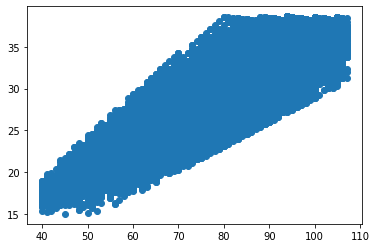

In [ ]:
plt.scatter(X[:, 0], X[:, 1])
plt.show()

In [ ]:
var_numericas = ['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']
df_numericas = df[var_numericas]

var_categoricas = df[['act_fisica', 'genero', 'colesterol', 'glucosa', 'tabaco', 'alcohol', 'enfermedad_cardiovascular']]

In [ ]:
inertia = []
for i in range(1,10):
    kmeans = cluster.KMeans (n_clusters = i, init='k-means++', random_state=18)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

In [ ]:
silueta = {}
for i in range(2,10):
    kmeans = cluster.KMeans (n_clusters = i, init='k-means++', random_state=18, n_init=15, max_iter=500)
    kmeans.fit(X)
    silueta[i] = silhouette_score(X, kmeans.labels_, metric='euclidean')

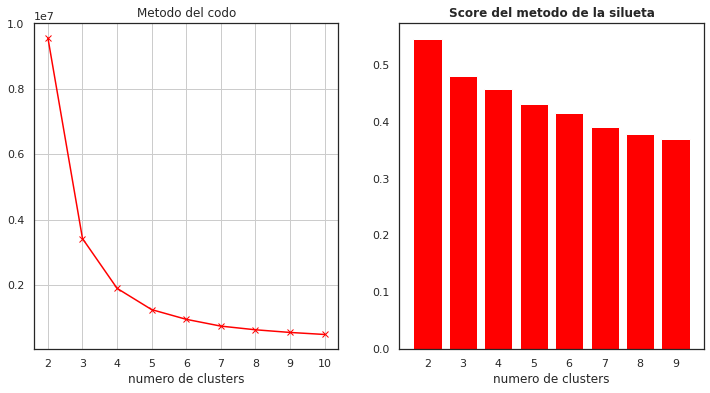

In [ ]:
sns.set(style= 'white', rc={'figure.figsize':(12,6)})
plt.subplot(1,2,1)
plt.plot(range(2,len(inertia)+2),inertia, marker='x', color='red')
plt.xlabel('numero de clusters')
plt.title('Metodo del codo')
plt.grid (True)

plt.subplot(1,2,2)
plt.bar(range(len(silueta)),list(silueta.values()), align='center', color='red')
plt.xticks(range(len(silueta)),list(silueta.keys()))
plt.title('Score del metodo de la silueta', fontweight= 'bold')
plt.xlabel('numero de clusters')
plt.show()

Podemos ver que en el método del codo, el primer punto de quiebre es 3 y el segundo 4. Por lo que primero ocuparemos 3 clusters.

[[60.43530921 23.18444693]
 [89.66893544 32.23357686]
 [73.61806357 26.99053327]]


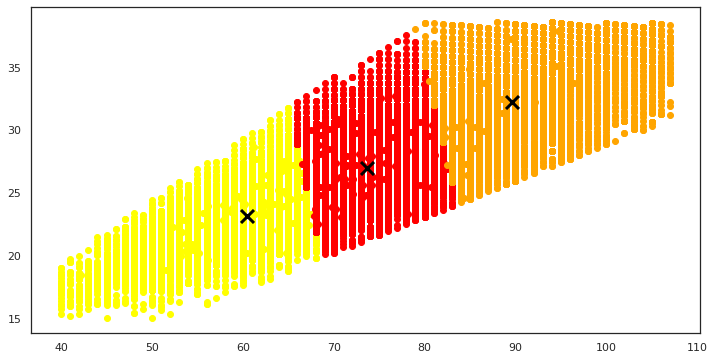

In [ ]:
kmeans = KMeans(n_clusters = 3, init = 'k-means++')
kmeans.fit(X)
centroides = kmeans.cluster_centers_
print(centroides)

clusters = kmeans.fit_predict(X)
df['label'] = clusters

plt.scatter(df.peso[df.label == 0], df.imc[df.label == 0], color = 'yellow')
plt.scatter(df.peso[df.label == 1], df.imc[df.label == 1], color = 'red')
plt.scatter(df.peso[df.label == 2], df.imc[df.label == 2], color = 'orange')

plt.scatter(centroides[:,0], centroides[:,1],marker='x', s=169, linewidths=3,
            color='black', zorder=10,lw=3) 
plt.show()

[[68.56640558 25.35802984]
 [93.19096821 33.21212066]
 [57.65652803 22.44805722]
 [79.54373983 29.08472579]]


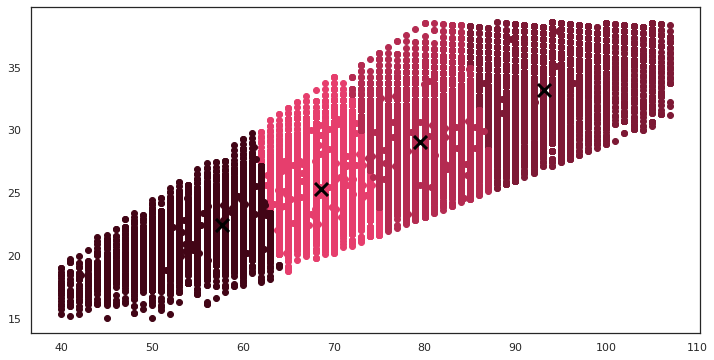

In [ ]:
kmeans = KMeans(n_clusters = 4, init = 'k-means++')
kmeans.fit(X)
centroides = kmeans.cluster_centers_
print(centroides)

clusters = kmeans.fit_predict(X)
df['label'] = clusters

plt.scatter(df.peso[df.label == 0], df.imc[df.label == 0], color = '#E63E6D')
plt.scatter(df.peso[df.label == 1], df.imc[df.label == 1], color = '#7D1935')
plt.scatter(df.peso[df.label == 2], df.imc[df.label == 2], color = '#420516')
plt.scatter(df.peso[df.label == 3], df.imc[df.label == 3], color = '#B42B51')

plt.scatter(centroides[:, 0], centroides[:, 1], marker = 'x', s = 169, linewidths = 3,
            color = 'black', zorder = 10, lw = 3) 
plt.show()

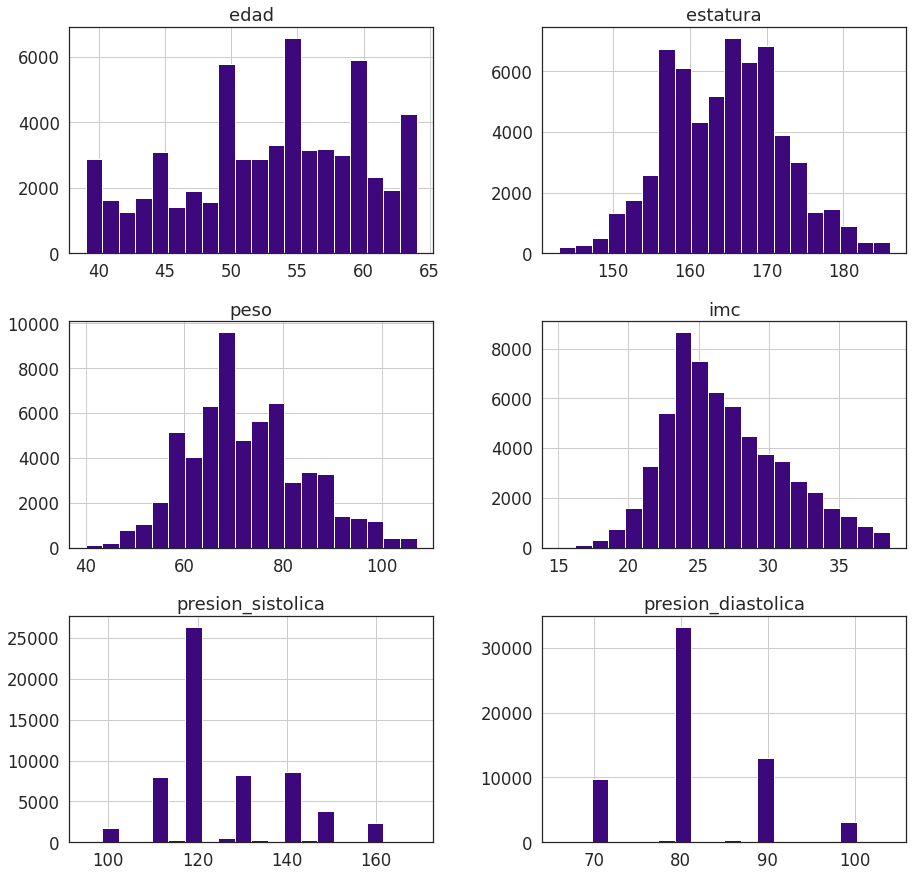

In [ ]:
sns.set(style = 'white', font_scale = 1.5, rc = {'figure.figsize': (15, 15)})
ax = df_numericas.hist(bins = 20, color = '#3D087B')

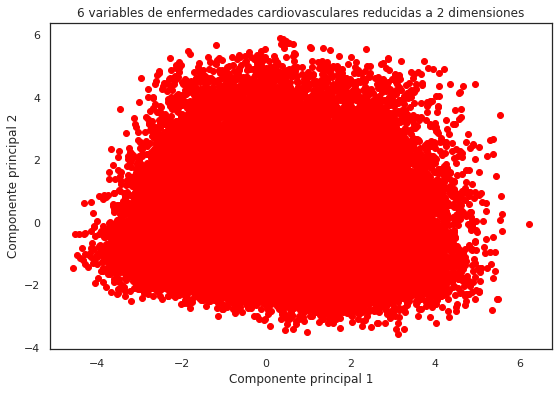

In [ ]:
std_scaler = StandardScaler()
data_cluster = df.copy()
data_cluster[data_cluster.columns] = std_scaler.fit_transform(data_cluster)

pca_2 = PCA(2)
pca_2_resultados = pca_2.fit_transform(data_cluster)

sns.set(style = 'white', rc = {'figure.figsize': (9, 6)})
plt.scatter(x=pca_2_resultados[:, 0], y = pca_2_resultados[:, 1], color = 'red')
plt.xlabel('Componente principal 1')
plt.ylabel('Componente principal 2')
plt.title('6 variables de enfermedades cardiovasculares reducidas a 2 dimensiones')
plt.show()

## Postwork 4

<Figure size 720x720 with 0 Axes>

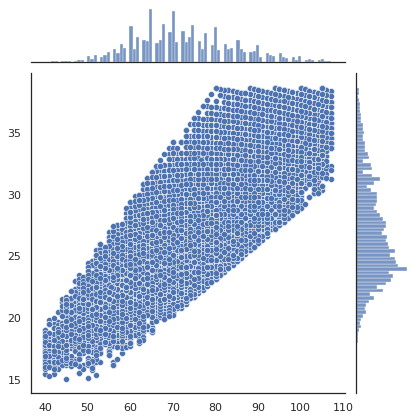

In [ ]:
plt.figure(figsize=(10,10))
sns.jointplot(x=df.peso.values, y=df.imc.values)
plt.ylabel('IMC', fontsize=12)
plt.xlabel('Peso', fontsize=12)
plt.show()

In [ ]:
x = df[['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']].values
y = df[['enfermedad_cardiovascular']].values

In [ ]:
x_train, x_test, y_train, y_test = particionar(x, y, 0.7, 0.3)

In [ ]:
regressor = LinearRegression()
prediccion = regressor.fit(x_train, y_train)

In [ ]:
regressor.score(x_test, y_test)

0.21377144962489114

In [ ]:
datos_persona = np.array([[24, 180, 80, 24.48, 180, 80]])
print(f'Predicción: {prediccion.predict(datos_persona)}% de que esta persona tenga una enfermedad cardiovascular')

Predicción: [[0.84335477]]% de que esta persona tenga una enfermedad cardiovascular


In [ ]:
x = df.drop(columns=['enfermedad_cardiovascular']).values
y = df[['enfermedad_cardiovascular']].values

In [ ]:
x_train, x_test, y_train, y_test = particionar(x, y, 0.7, 0.3)

In [ ]:
regressor = LinearRegression()
prediccion = regressor.fit(x_train, y_train)

In [ ]:
regressor.score(x_test, y_test)

0.22999179596037708

In [ ]:
x = df['estatura'].values
y = df['imc'].values

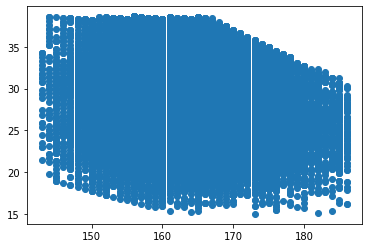

In [ ]:

plt.scatter(x,y)
plt.show()

In [ ]:
# Hagamos una regresión polinomial, con una recta de regresión estimada como
# y = b0 + b1*x +b2*x^2 + b3*x^3 + ... + bn*x^n
polynominal_regression = PolynomialFeatures(degree=20)
x_polynomial = polynominal_regression.fit_transform(x,y)

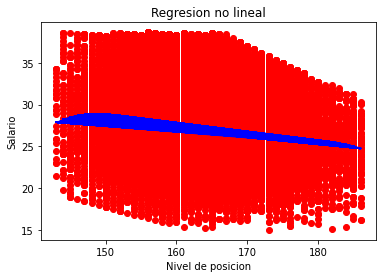

In [ ]:
# Hagamos el fit de los datos
linear_regression = LinearRegression()
linear_regression.fit(x_polynomial,y)

# Veamos como se ajusta la nueva regresión polinomica
y_head2 = linear_regression.predict(x_polynomial)

poly_reg = PolynomialFeatures(degree = 4)
X_poly = poly_reg.fit_transform(x)
poly_reg.fit(X_poly, y)
lin_reg_2 = LinearRegression()
lin_reg_2.fit(X_poly, y)

plt.scatter(x, y, color = 'red')
plt.plot(x, lin_reg_2.predict(poly_reg.fit_transform(x)), color = 'blue')
plt.title('Regresion no lineal')
plt.xlabel('Nivel de posicion')
plt.ylabel('Salario')
plt.show()

In [ ]:
# Calculemos el R^2

from sklearn.metrics import r2_score
print("r_square score: ", r2_score(y,y_head2))

r_square score:  0.04409541273327455


## Postwork 5

In [ ]:
df.head()

,edad,genero,estatura,peso,imc,presion_sistolica,presion_diastolica,colesterol,glucosa,tabaco,alcohol,act_fisica,enfermedad_cardiovascular,label
0,50,2,168,62.0,21.97,110,80,1,1,0,0,1,0,2
1,55,1,156,85.0,34.93,140,90,3,1,0,0,1,1,3
2,51,1,165,64.0,23.51,130,70,3,1,0,0,0,1,0
3,48,2,169,82.0,28.71,150,100,1,1,0,0,1,1,3
5,60,1,151,67.0,29.38,120,80,2,2,0,0,0,0,0


In [ ]:
y = df['enfermedad_cardiovascular'].values
x = df[['genero', 'colesterol', 'glucosa', 'tabaco', 'alcohol', 'act_fisica']].values

In [ ]:
arbol = treeClassifier.DecisionTreeClassifier()
arbol = arbol.fit(x, y)

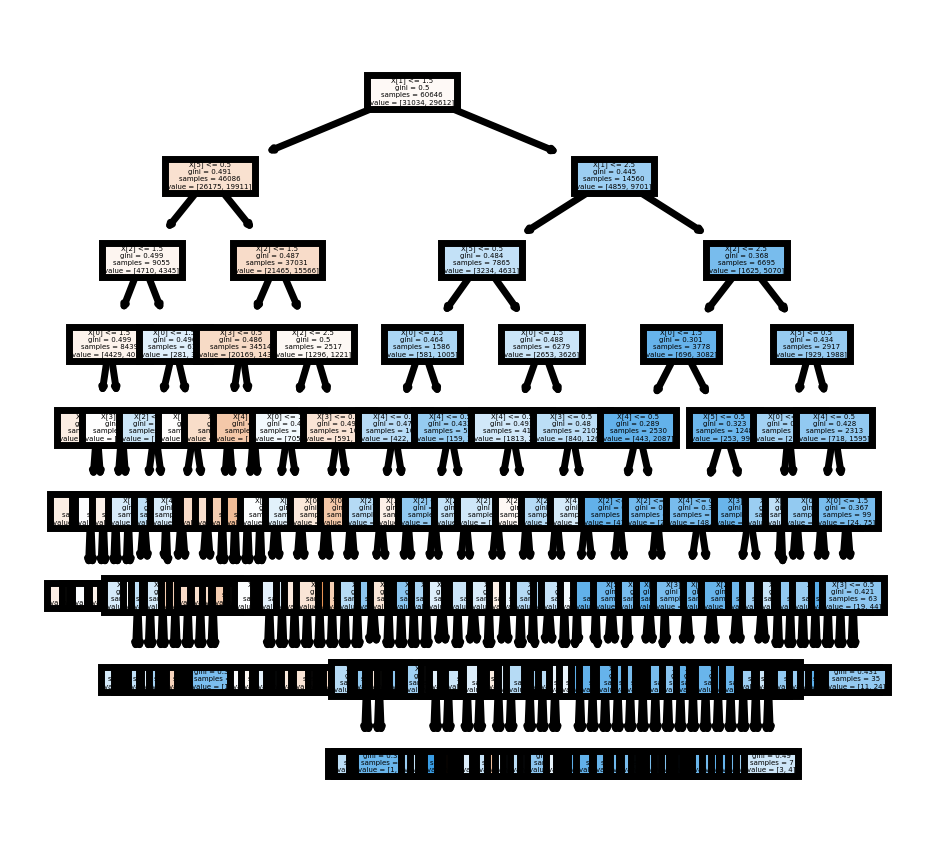

In [ ]:
plt.figure(figsize = (2, 2), dpi = 500)
treeClassifier.plot_tree(arbol, filled = True)
plt.show()

In [ ]:
caracteristicas = np.array([[1, 1, 1, 0, 0, 1]], dtype = np.int16)

print(f'La predicción para la predisposición para padecer una enfermedad cardiovascular: {"Positiva" if arbol.predict(caracteristicas)[0] else "Negativa"}')

La predicción para la predisposición para padecer una enfermedad cardiovascular: Negativa


In [ ]:
# NO OLVIDAR COMENTAR
bosque = forest(n_estimators = 800, random_state = 7)
bosque.fit(x, y)

c1 = np.array([[1, 1, 1, 0, 0, 1]], dtype = np.int16)
c2 = np.array([[1, 2, 1, 0, 0, 1]], dtype = np.int16)
c3 = np.array([[1, 1, 1, 1, 0, 1]], dtype = np.int16)
c4 = np.array([[1, 1, 1, 0, 1, 0]], dtype = np.int16)

print(f'Paciente 1 | Características 1: {"Positiva" if bosque.predict(c1)[0] else "Negativa"}')
print(f'Paciente 1 | Características 2: {"Positiva" if bosque.predict(c2)[0] else "Negativa"}')
print(f'Paciente 1 | Características 3: {"Positiva" if bosque.predict(c3)[0] else "Negativa"}')
print(f'Paciente 1 | Características 4: {"Positiva" if bosque.predict(c4)[0] else "Negativa"}')

Paciente 1 | Características 1: Negativa
Paciente 1 | Características 2: Positiva
Paciente 1 | Características 3: Negativa
Paciente 1 | Características 4: Negativa


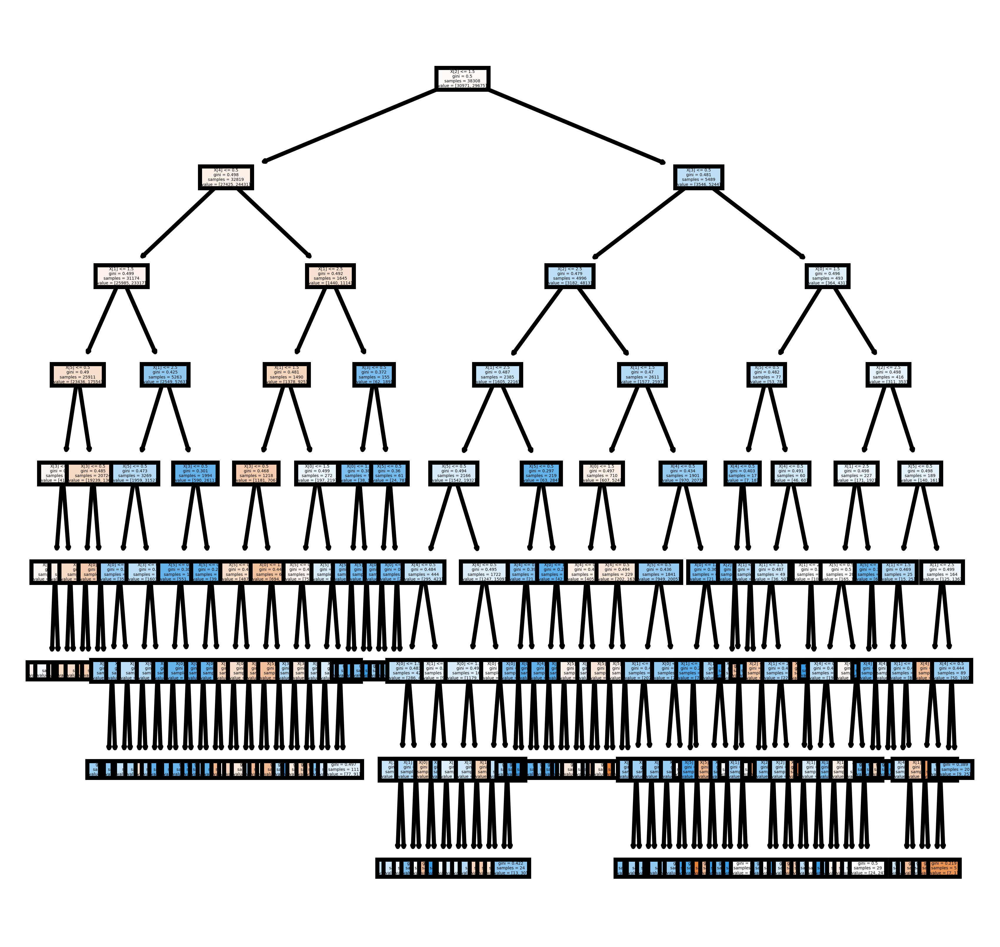

In [ ]:
numero_arbol = 7
arbolDelBosque = bosque.estimators_[numero_arbol]

plt.figure(figsize = (4, 4), dpi = 1000)
treeClassifier.plot_tree(arbolDelBosque, filled = True);
plt.show()

## Postwork 6

In [ ]:
df.head()

,edad,genero,estatura,peso,imc,presion_sistolica,presion_diastolica,colesterol,glucosa,tabaco,alcohol,act_fisica,enfermedad_cardiovascular
0,50,2,168,62.0,21.97,110,80,1,1,0,0,1,0
1,55,1,156,85.0,34.93,140,90,3,1,0,0,1,1
2,51,1,165,64.0,23.51,130,70,3,1,0,0,0,1
3,48,2,169,82.0,28.71,150,100,1,1,0,0,1,1
5,60,1,151,67.0,29.38,120,80,2,2,0,0,0,0


In [ ]:
X = df_numericas
y = df['enfermedad_cardiovascular']

In [ ]:
red_neuronal = Sequential()
red_neuronal.add(Dense(8, input_dim = 6, activation = "relu"))
red_neuronal.add(Dense(6, activation = "relu"))
red_neuronal.add(Dense(1, activation = "sigmoid"))

In [ ]:
red_neuronal.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])

In [ ]:
red_neuronal.fit(X, y, epochs = 50, batch_size = 10)

Epoch 1/50
6065/6065 [==============================] - 8s 1ms/step - loss: 1.0597 - accuracy: 0.6358
Epoch 2/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.6167 - accuracy: 0.6723
Epoch 3/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.6049 - accuracy: 0.6845
Epoch 4/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.6007 - accuracy: 0.6877
Epoch 5/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5960 - accuracy: 0.6919
Epoch 6/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5920 - accuracy: 0.6967
Epoch 7/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5874 - accuracy: 0.6997
Epoch 8/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5833 - accuracy: 0.7032
Epoch 9/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5831 - accuracy: 0.7037
Epoch 10/50
6065/6065 [==============================] - 8s 1ms/step - loss: 0.581

In [ ]:
_, accuracy = red_neuronal.evaluate(X, y)
print("Accuracy: %.2f" % (accuracy * 100))

1896/1896 [==============================] - 2s 1ms/step - loss: 0.5680 - accuracy: 0.7080
Accuracy: 70.80


In [ ]:
New = red_neuronal.predict(X)
predictions = (New > 0.5).astype('int32')

for i, j in enumerate(y):
    print(f'Paciente {i}: {predictions[i]} | {y[j]}') 

Paciente 0: [0] | 0
Paciente 1: [1] | 1
Paciente 2: [0] | 1
Paciente 3: [1] | 1
Paciente 4: [0] | 0
Paciente 5: [1] | 0
Paciente 6: [1] | 1
Paciente 7: [0] | 0
Paciente 8: [0] | 0
Paciente 9: [0] | 0
Paciente 10: [0] | 0
Paciente 11: [0] | 0
Paciente 12: [0] | 0
Paciente 13: [0] | 0
Paciente 14: [0] | 0
Paciente 15: [0] | 0
Paciente 16: [0] | 0
Paciente 17: [0] | 0
Paciente 18: [1] | 0
Paciente 19: [1] | 1
Paciente 20: [1] | 1
Paciente 21: [1] | 0
Paciente 22: [1] | 0
Paciente 23: [0] | 0
Paciente 24: [0] | 0
Paciente 25: [0] | 0
Paciente 26: [1] | 1
Paciente 27: [0] | 0
Paciente 28: [1] | 1
Paciente 29: [1] | 1
Paciente 30: [0] | 0
Paciente 31: [0] | 0
Paciente 32: [0] | 0
Paciente 33: [1] | 1
Paciente 34: [1] | 1
Paciente 35: [0] | 0
Paciente 36: [0] | 1
Paciente 37: [1] | 1
Paciente 38: [1] | 1
Paciente 39: [0] | 0
Paciente 40: [0] | 0
Paciente 41: [0] | 0
Paciente 42: [1] | 1
Paciente 43: [1] | 1
Paciente 44: [1] | 1
Paciente 45: [1] | 1
Paciente 46: [0] | 0
Paciente 47: [1] | 1
Pa

KeyboardInterrupt: ignored

In [ ]:
print(f'Matriz de confusión: \n')

Matrix_confusion(y, predictions)

Matriz de confusión: 

[[26316  4718]
 [12993 16619]]

True positives: 26316
True negatives: 16619
False positives: 12993
False negative: 4718

Exactitud: 70.7960953731491%
Sensibilidad: 84.79731906940775%
Especificidad: 56.1225178981494%
Precisión: 66.9465008013432%


In [ ]:
X = df.drop(columns = ['enfermedad_cardiovascular'])
y = df['enfermedad_cardiovascular']

In [ ]:
red_neuronal = Sequential()
red_neuronal.add(Dense(16, input_dim = 12, activation = "relu"))
red_neuronal.add(Dense(12, activation = "relu"))
red_neuronal.add(Dense(1, activation = "sigmoid"))

In [ ]:
red_neuronal.compile(loss = "binary_crossentropy", optimizer = "adam", metrics = ["accuracy"])

In [ ]:
red_neuronal.fit(X, y, epochs = 25, batch_size = 10)

Epoch 1/25
6065/6065 [==============================] - 9s 1ms/step - loss: 0.6185 - accuracy: 0.6837
Epoch 2/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5792 - accuracy: 0.7081
Epoch 3/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5723 - accuracy: 0.7127
Epoch 4/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5681 - accuracy: 0.7168
Epoch 5/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5662 - accuracy: 0.7167
Epoch 6/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5642 - accuracy: 0.7187
Epoch 7/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5629 - accuracy: 0.7186
Epoch 8/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5632 - accuracy: 0.7207
Epoch 9/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.5622 - accuracy: 0.7192
Epoch 10/25
6065/6065 [==============================] - 8s 1ms/step - loss: 0.560

In [ ]:
_, accuracy = red_neuronal.evaluate(X, y)
print("Accuracy: %.2f" % (accuracy * 100))

1896/1896 [==============================] - 2s 1ms/step - loss: 0.5535 - accuracy: 0.7256
Accuracy: 72.56


In [ ]:
New = red_neuronal.predict(X)
predictions = (New > 0.5).astype('int32')

for i, j in enumerate(y):
    print(f'Paciente {i}: {predictions[i]} | {y[j]}') 

Se truncaron las últimas líneas 5000 del resultado de transmisión.
Paciente 55646: [0] | 0
Paciente 55647: [0] | 1
Paciente 55648: [1] | 1
Paciente 55649: [0] | 0
Paciente 55650: [1] | 1
Paciente 55651: [0] | 0
Paciente 55652: [1] | 0
Paciente 55653: [1] | 0
Paciente 55654: [0] | 0
Paciente 55655: [0] | 1
Paciente 55656: [0] | 0
Paciente 55657: [1] | 1
Paciente 55658: [1] | 0
Paciente 55659: [1] | 0
Paciente 55660: [0] | 0
Paciente 55661: [0] | 0
Paciente 55662: [1] | 1
Paciente 55663: [1] | 0
Paciente 55664: [1] | 1
Paciente 55665: [0] | 0
Paciente 55666: [1] | 0
Paciente 55667: [0] | 1
Paciente 55668: [1] | 0
Paciente 55669: [0] | 0
Paciente 55670: [1] | 1
Paciente 55671: [1] | 1
Paciente 55672: [1] | 1
Paciente 55673: [0] | 0
Paciente 55674: [1] | 1
Paciente 55675: [1] | 1
Paciente 55676: [1] | 1
Paciente 55677: [1] | 1
Paciente 55678: [1] | 0
Paciente 55679: [0] | 1
Paciente 55680: [0] | 1
Paciente 55681: [0] | 0
Paciente 55682: [1] | 1
Paciente 55683: [0] | 1
Paciente 55684: [0] |

In [ ]:
print(f'Matriz de confusión: \n')

Matrix_confusion(y, predictions)

Matriz de confusión: 

[[23489  7545]
 [ 9098 20514]]

True positives: 23489
True negatives: 20514
False positives: 9098
False negative: 7545

Exactitud: 72.55713484813508%
Sensibilidad: 75.68795514596894%
Especificidad: 69.275969201675%
Precisión: 72.08089115291374%


In [ ]:
from sklearn.metrics import plot_confusion_matrix

In [ ]:
plot_confusion_matrix(predictions, X, y) 
plt.show()

## Postwork 7

In [ ]:
X = df.drop(['enfermedad_cardiovascular'], axis=1)
y = df.enfermedad_cardiovascular

In [ ]:
x_train, x_test, y_train, y_test = particionar(X, y, 0.7, 0.3)

In [ ]:
x_train.head(1)

,edad,genero,estatura,peso,imc,presion_sistolica,presion_diastolica,colesterol,glucosa,tabaco,alcohol,act_fisica
20125,54,1,160,80.0,31.25,130,80,3,1,0,0,1


In [ ]:
numerical_cols = x_train[['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']]
categorical_cols = x_train[['genero', 'colesterol', 'glucosa', 'alcohol', 'tabaco', 'act_fisica']]

In [ ]:
categorical_cols = [cname for cname in x_train.columns if x_train[cname].nunique() < 10 and 
                        x_train[cname].dtype == "object"]

numerical_cols = [cname for cname in x_train.columns if x_train[cname].dtype in ['int64', 'float64']]

In [ ]:
my_cols = categorical_cols + numerical_cols
X_train = x_train[my_cols].copy()
X_test = x_test[my_cols].copy()

In [ ]:
numerical_transformer = SimpleImputer(strategy = 'constant')

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# Juntar variables categoricas y numericas
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_cols),
        ('cat', categorical_transformer, categorical_cols)
    ])

In [ ]:
model = RandomForestRegressor(n_estimators = 50, random_state = 0)

In [ ]:
my_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                              ('model', model)])

# Enbonar el training
my_pipeline.fit(X_train, y_train)

# Adjuntar el training data y terminar el fit
preds = my_pipeline.predict(X_test)

# Siguiente paso: evaluación del modelo
score = mean_absolute_error(y_test, preds)
print('MAE:', score)

MAE: 0.3763546308805537


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



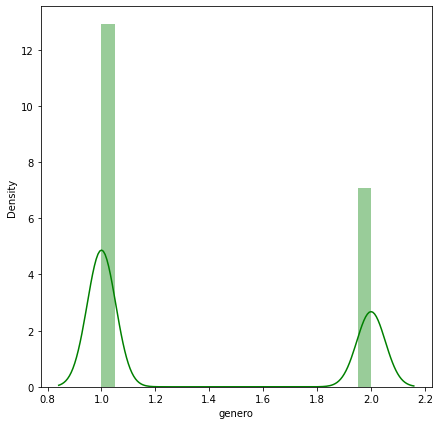

In [ ]:
plt.figure(figsize = (7, 7)); 
sns.distplot(df.genero, color = 'green');

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



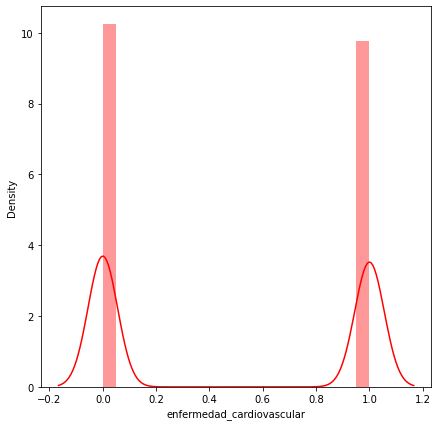

In [ ]:
plt.figure(figsize = (7, 7)) 
sns.distplot(df.enfermedad_cardiovascular, color = 'red')

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



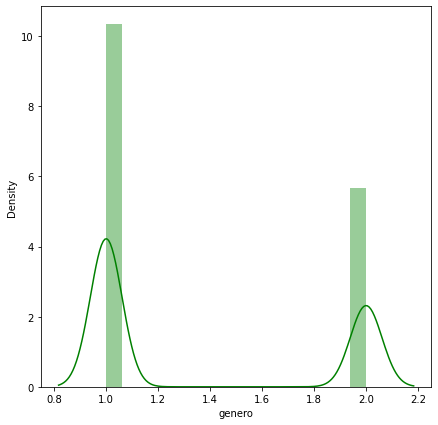

In [ ]:
enfermedad = df[df['enfermedad_cardiovascular'] == 1]

plt.figure(figsize = (7, 7)); 
sns.distplot(enfermedad.genero, color = 'green');

In [ ]:
report = create_report(df, title = 'Enfermedad Cardiovascular')

Enfermedad Cardiovascular
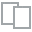
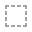
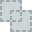
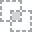
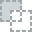
...
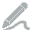
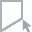
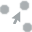
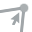
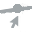

In [ ]:
report

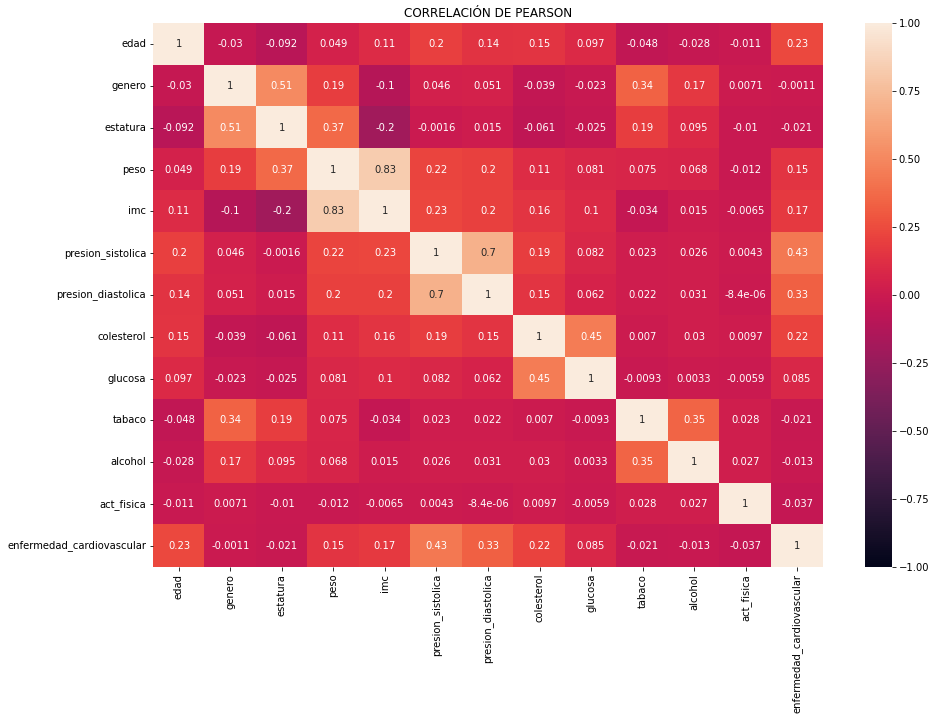

In [ ]:
pearson_corr = df.corr()

figure = plt.figure(figsize = (15, 10))
sns.heatmap(pearson_corr, annot=True, vmin = -1, vmax = +1)
plt.title("CORRELACIÓN DE PEARSON")
plt.show()

In [ ]:
x = df.drop(columns = ['enfermedad_cardiovascular'])
y = df['enfermedad_cardiovascular']

x_train, x_test, y_train, y_test = particionar(x, y, 0.7, 0.3)

In [ ]:
num_pipe = Pipeline([("scaler",StandardScaler()),
                    ("transform",PowerTransformer(method='yeo-johnson'))])

cat_pipe = Pipeline([("encoder",OneHotEncoder())])

In [ ]:
var_numericas

['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']

In [ ]:
preprosesor = ColumnTransformer([("numeric", num_pipe, ['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']),
                              
                               ("category", cat_pipe, ['act_fisica', 'genero', 'colesterol', 'glucosa', 'tabaco', 'alcohol'])])


pipeline = Pipeline([("prep", preprosesor),
                    ("algo", RandomForestClassifier(random_state = 7, n_jobs = -1))])

parameter_rf = {'algo__n_estimators': [100, 150, 200],
 'algo__max_depth': [20, 50, 80],
 'algo__max_features': [0.3, 0.6, 0.8],
 'algo__min_samples_leaf': [1, 5, 10]}

rf = GridSearchCV(pipeline,parameter_rf, cv = 3, n_jobs = -1, verbose = 1)
rf.fit(x_train,y_train)

# evaluacion
print(rf.best_params_)
print(rf.score(x_train, y_train),rf.best_score_,rf.score(x_test, y_test))

Fitting 3 folds for each of 81 candidates, totalling 243 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  4.7min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 24.1min
[Parallel(n_jobs=-1)]: Done 243 out of 243 | elapsed: 31.3min finished


{'algo__max_depth': 50, 'algo__max_features': 0.3, 'algo__min_samples_leaf': 10, 'algo__n_estimators': 200}
0.7729435597851692 0.7237350488367973 0.7269429482246894


In [ ]:
preprosesor = ColumnTransformer([("numeric", num_pipe, ['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']),
                              
                               ("category", cat_pipe, ['act_fisica', 'genero', 'colesterol', 'glucosa', 'tabaco', 'alcohol'])])


pipeline = Pipeline([("prep", preprosesor),
                    ("algo", LogisticRegression(multi_class = 'multinomial', solver = 'lbfgs', n_jobs = -1, random_state = 7))])

parameter_logreg = {'algo__fit_intercept': [True, False],
 'algo__C': np.logspace(-3, 3, 7)}

logreg = GridSearchCV(pipeline, parameter_logreg, cv = 3, n_jobs = -1, verbose = 1)
logreg.fit(x_train, y_train)

# evaluacion
print(logreg.best_params_)
print(logreg.score(x_train, y_train),logreg.best_score_,logreg.score(x_test, y_test))

Fitting 3 folds for each of 14 candidates, totalling 42 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 out of  42 | elapsed:   23.7s finished


{'algo__C': 1.0, 'algo__fit_intercept': True}
0.7208376519363046 0.7206020992327495 0.724249752665714


In [ ]:
preprosesor = ColumnTransformer([("numeric", num_pipe, ['edad', 'estatura', 'peso', 'imc', 'presion_sistolica', 'presion_diastolica']),
                              
                               ("category", cat_pipe, ['act_fisica', 'genero', 'colesterol', 'glucosa', 'tabaco', 'alcohol'])])


pipeline = Pipeline([("prep", preprosesor),
                    ("algo", KNeighborsClassifier())])

parameter_knn = {'algo__n_neighbors': np.arange(1, 30, 2),
 'algo__weights': ['uniform', 'distance'],
 'algo__p': [1, 1.5, 2]}

knn = GridSearchCV(pipeline, parameter_knn, cv = 3, n_jobs = -1, verbose = 1)
knn.fit(x_train, y_train)

# Evaluation
print(knn.best_params_)
print(knn.score(x_train, y_train), knn.best_score_, knn.score(x_test, y_test))

Fitting 3 folds for each of 90 candidates, totalling 270 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  6.2min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed: 42.0min
[Parallel(n_jobs=-1)]: Done 270 out of 270 | elapsed: 63.9min finished


{'algo__n_neighbors': 27, 'algo__p': 1.5, 'algo__weights': 'uniform'}
0.7353246019033262 0.7167154464479903 0.7196878091678576


In [ ]:
models = [knn, rf, logreg]
train_accuracy = []
test_accuracy = []

for i in models:
    y_pred_train = i.predict(x_train)
    accuracy_train = accuracy_score(y_train, y_pred_train)
    train_accuracy.append(accuracy_train)
    y_pred_test = i.predict(x_test)
    accuracy_test = accuracy_score(y_test, y_pred_test)
    test_accuracy.append(accuracy_test)

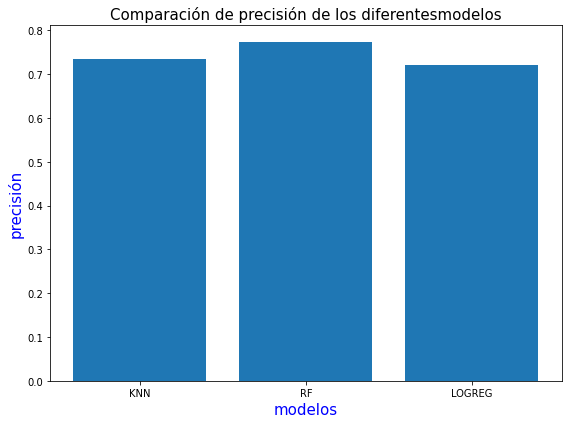

In [ ]:
plt.figure(figsize = (8, 6))
plt.bar(['KNN', 'RF', 'LOGREG'], train_accuracy)
plt.title('Comparación de precisión de los diferentesmodelos', fontsize = 15, color = 'black')
plt.xlabel('modelos', fontsize = 15, color = 'blue')
plt.ylabel('precisión', fontsize = 15, color = 'blue')
plt.tight_layout()
plt.show()

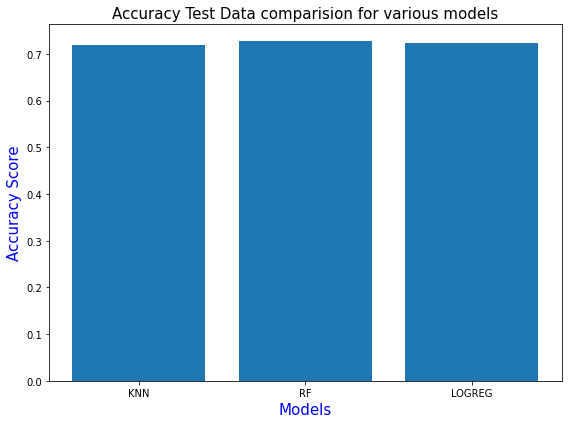

In [ ]:
plt.figure(figsize = (8, 6))
plt.bar(['KNN', 'RF', 'LOGREG'], test_accuracy)
plt.title('Accuracy Test Data comparision for various models', fontsize = 15, color = 'black')
plt.xlabel('Models', fontsize = 15, color = 'blue')
plt.ylabel('Accuracy Score', fontsize = 15, color = 'blue')
plt.tight_layout()
plt.show()